In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.preprocessing import PowerTransformer
from IPython.display import Image
from sklearn.cluster import AgglomerativeClustering 
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram,linkage
from sklearn.cluster import KMeans 
import scipy.stats as stats
from kneed import KneeLocator
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
df= pd.read_csv('CC GENERAL.csv')
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [2]:
df = df.drop(labels='CUST_ID', axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8950 non-null   float64
 1   BALANCE_FREQUENCY                 8950 non-null   float64
 2   PURCHASES                         8950 non-null   float64
 3   ONEOFF_PURCHASES                  8950 non-null   float64
 4   INSTALLMENTS_PURCHASES            8950 non-null   float64
 5   CASH_ADVANCE                      8950 non-null   float64
 6   PURCHASES_FREQUENCY               8950 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 10  CASH_ADVANCE_TRX                  8950 non-null   int64  
 11  PURCHASES_TRX                     8950 non-null   int64  
 12  CREDIT

In [3]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [4]:
df.isnull().sum().sum()

314

In [5]:
df.isnull().sum()

BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

### replacing null values in the minimum payments by zero if the payments were zero

In [6]:
df['CREDIT_LIMIT'].fillna(df['CREDIT_LIMIT'].mean(), inplace=True)
df.loc[(df.PAYMENTS == 0),'MINIMUM_PAYMENTS']=0
df.isnull().sum()

BALANCE                              0
BALANCE_FREQUENCY                    0
PURCHASES                            0
ONEOFF_PURCHASES                     0
INSTALLMENTS_PURCHASES               0
CASH_ADVANCE                         0
PURCHASES_FREQUENCY                  0
ONEOFF_PURCHASES_FREQUENCY           0
PURCHASES_INSTALLMENTS_FREQUENCY     0
CASH_ADVANCE_FREQUENCY               0
CASH_ADVANCE_TRX                     0
PURCHASES_TRX                        0
CREDIT_LIMIT                         0
PAYMENTS                             0
MINIMUM_PAYMENTS                    73
PRC_FULL_PAYMENT                     0
TENURE                               0
dtype: int64

### Checking if the data in Minimum payments is skewed to decide if the nulls would be replaced by mean or median

<AxesSubplot:xlabel='MINIMUM_PAYMENTS', ylabel='Density'>

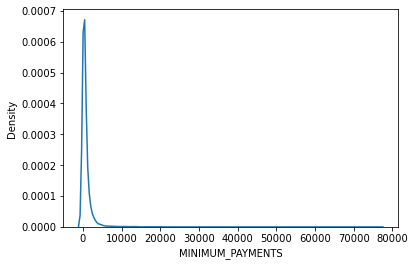

In [7]:
sns.kdeplot(x='MINIMUM_PAYMENTS', data=df)

### the data is skewed so I will be replacing the null values with median

In [8]:
df['MINIMUM_PAYMENTS'].fillna(df['MINIMUM_PAYMENTS'].median(), inplace=True)
df.isnull().sum()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

array([[<AxesSubplot:title={'center':'BALANCE'}>,
        <AxesSubplot:title={'center':'BALANCE_FREQUENCY'}>,
        <AxesSubplot:title={'center':'PURCHASES'}>],
       [<AxesSubplot:title={'center':'ONEOFF_PURCHASES'}>,
        <AxesSubplot:title={'center':'INSTALLMENTS_PURCHASES'}>,
        <AxesSubplot:title={'center':'CASH_ADVANCE'}>],
       [<AxesSubplot:title={'center':'PURCHASES_FREQUENCY'}>,
        <AxesSubplot:title={'center':'ONEOFF_PURCHASES_FREQUENCY'}>,
        <AxesSubplot:title={'center':'PURCHASES_INSTALLMENTS_FREQUENCY'}>],
       [<AxesSubplot:title={'center':'CASH_ADVANCE_FREQUENCY'}>,
        <AxesSubplot:title={'center':'CASH_ADVANCE_TRX'}>,
        <AxesSubplot:title={'center':'PURCHASES_TRX'}>],
       [<AxesSubplot:title={'center':'CREDIT_LIMIT'}>,
        <AxesSubplot:title={'center':'PAYMENTS'}>,
        <AxesSubplot:title={'center':'MINIMUM_PAYMENTS'}>],
       [<AxesSubplot:title={'center':'PRC_FULL_PAYMENT'}>,
        <AxesSubplot:title={'center':'TENURE

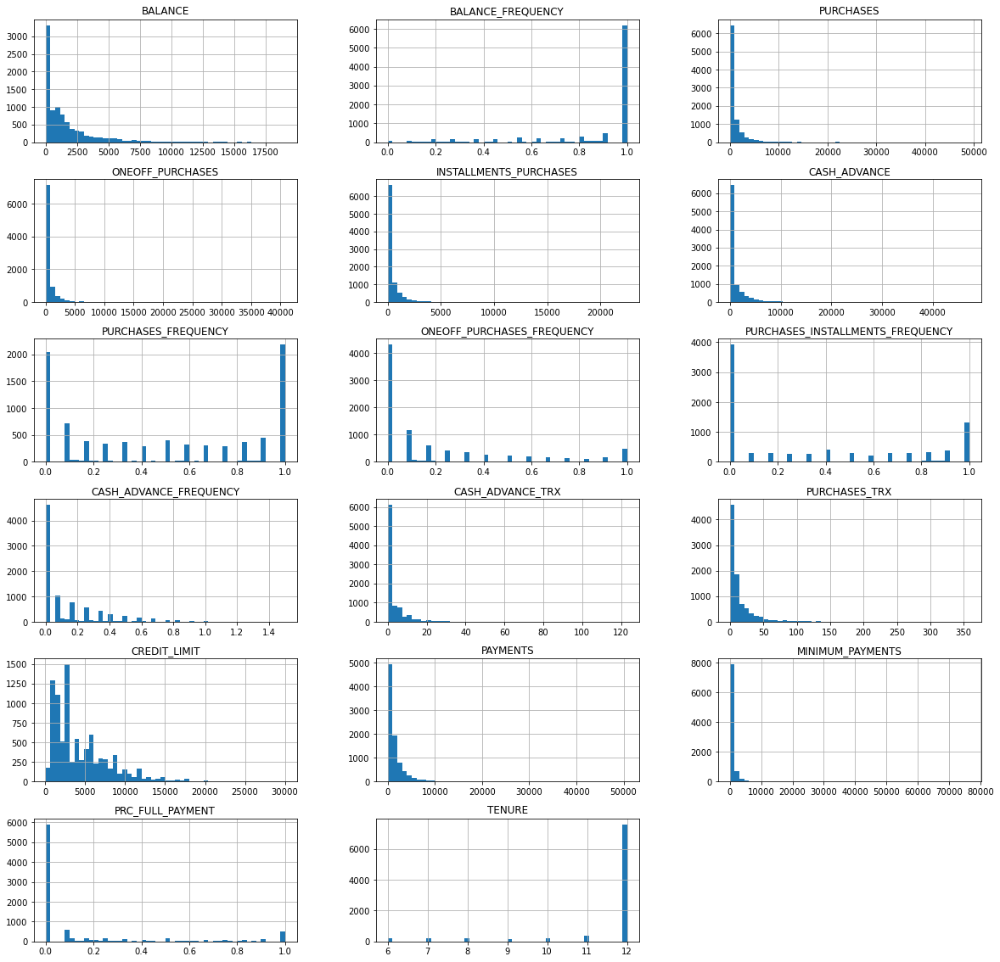

In [9]:
df.hist(bins=50, figsize=(20,20), layout=(6,3))

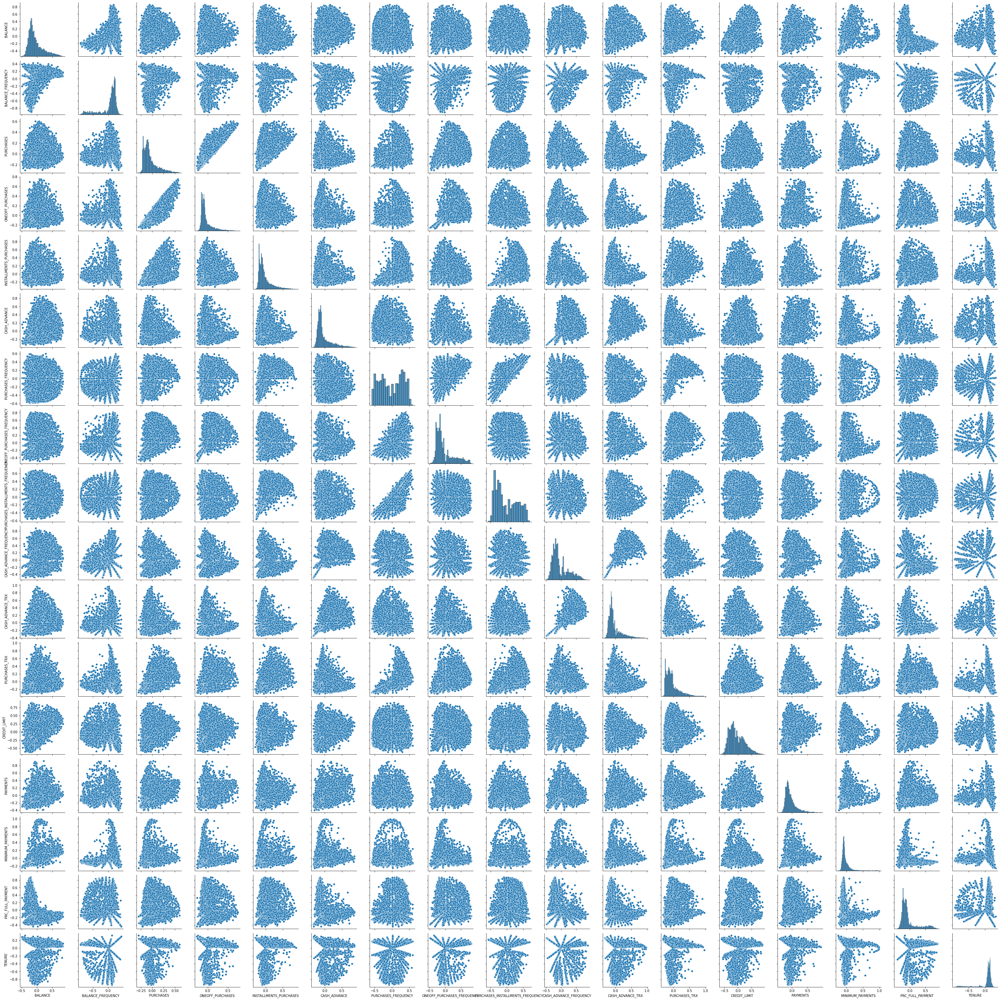

In [25]:
sns.pairplot(df)

### Standardizing and normalizing the data

In [10]:
x=df.columns.values
df = StandardScaler().fit_transform(df)
df = normalize(df)
df = pd.DataFrame(df) 
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,-0.312155,-0.106371,-0.181197,-0.152214,-0.148864,-0.199059,-0.343926,-0.289413,-0.301632,-0.288001,-0.203019,-0.218057,-0.409574,-0.225582,-0.127264,-0.224120,0.153811
1,0.219906,0.037535,-0.131210,-0.099741,-0.127026,0.728103,-0.341405,-0.189643,-0.256243,0.160387,0.030759,-0.165370,0.192431,0.228759,0.028236,0.065452,0.100787
2,0.126694,0.146797,-0.030507,0.030853,-0.128802,-0.132262,0.359805,0.757511,-0.259827,-0.191357,-0.134892,-0.030890,0.234061,-0.108749,-0.025372,-0.148913,0.102197
3,0.020360,-0.421709,0.096230,0.226493,-0.188503,-0.152873,-0.420537,-0.165589,-0.380259,-0.107366,-0.136651,-0.228722,0.342551,-0.248264,-0.148526,-0.217935,0.149566
4,-0.151683,0.219035,-0.195351,-0.146829,-0.192186,-0.197348,-0.428752,-0.168824,-0.387687,-0.285524,-0.201273,-0.233190,-0.382812,-0.154047,-0.107108,-0.222192,0.152488
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,-0.146918,0.103145,-0.066355,-0.071062,-0.026408,-0.092932,0.252813,-0.135115,0.234893,-0.134455,-0.094781,-0.069763,-0.191213,-0.096801,-0.067141,0.235713,-0.820801
8946,-0.151351,0.105617,-0.067098,-0.072765,-0.025039,-0.095159,0.258871,-0.138352,0.240522,-0.137677,-0.097052,-0.071435,-0.195795,-0.102623,-0.047301,-0.107139,-0.840471
8947,-0.157004,-0.039331,-0.085238,-0.075689,-0.062533,-0.098983,0.181215,-0.143912,0.161260,-0.143210,-0.100952,-0.082836,-0.203663,-0.121000,-0.068467,0.069808,-0.874245
8948,-0.154348,-0.038418,-0.097258,-0.073932,-0.094156,-0.093074,-0.253063,-0.140571,-0.189937,0.032629,-0.037904,-0.122579,-0.227399,-0.120246,-0.069243,0.068187,-0.853949


In [11]:
for i in range(len(x)):
    df = df.rename({i:x[i]}, axis=1)
df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.312155,-0.106371,-0.181197,-0.152214,-0.148864,-0.199059,-0.343926,-0.289413,-0.301632,-0.288001,-0.203019,-0.218057,-0.409574,-0.225582,-0.127264,-0.224120,0.153811
1,0.219906,0.037535,-0.131210,-0.099741,-0.127026,0.728103,-0.341405,-0.189643,-0.256243,0.160387,0.030759,-0.165370,0.192431,0.228759,0.028236,0.065452,0.100787
2,0.126694,0.146797,-0.030507,0.030853,-0.128802,-0.132262,0.359805,0.757511,-0.259827,-0.191357,-0.134892,-0.030890,0.234061,-0.108749,-0.025372,-0.148913,0.102197
3,0.020360,-0.421709,0.096230,0.226493,-0.188503,-0.152873,-0.420537,-0.165589,-0.380259,-0.107366,-0.136651,-0.228722,0.342551,-0.248264,-0.148526,-0.217935,0.149566
4,-0.151683,0.219035,-0.195351,-0.146829,-0.192186,-0.197348,-0.428752,-0.168824,-0.387687,-0.285524,-0.201273,-0.233190,-0.382812,-0.154047,-0.107108,-0.222192,0.152488
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,-0.146918,0.103145,-0.066355,-0.071062,-0.026408,-0.092932,0.252813,-0.135115,0.234893,-0.134455,-0.094781,-0.069763,-0.191213,-0.096801,-0.067141,0.235713,-0.820801
8946,-0.151351,0.105617,-0.067098,-0.072765,-0.025039,-0.095159,0.258871,-0.138352,0.240522,-0.137677,-0.097052,-0.071435,-0.195795,-0.102623,-0.047301,-0.107139,-0.840471
8947,-0.157004,-0.039331,-0.085238,-0.075689,-0.062533,-0.098983,0.181215,-0.143912,0.161260,-0.143210,-0.100952,-0.082836,-0.203663,-0.121000,-0.068467,0.069808,-0.874245
8948,-0.154348,-0.038418,-0.097258,-0.073932,-0.094156,-0.093074,-0.253063,-0.140571,-0.189937,0.032629,-0.037904,-0.122579,-0.227399,-0.120246,-0.069243,0.068187,-0.853949


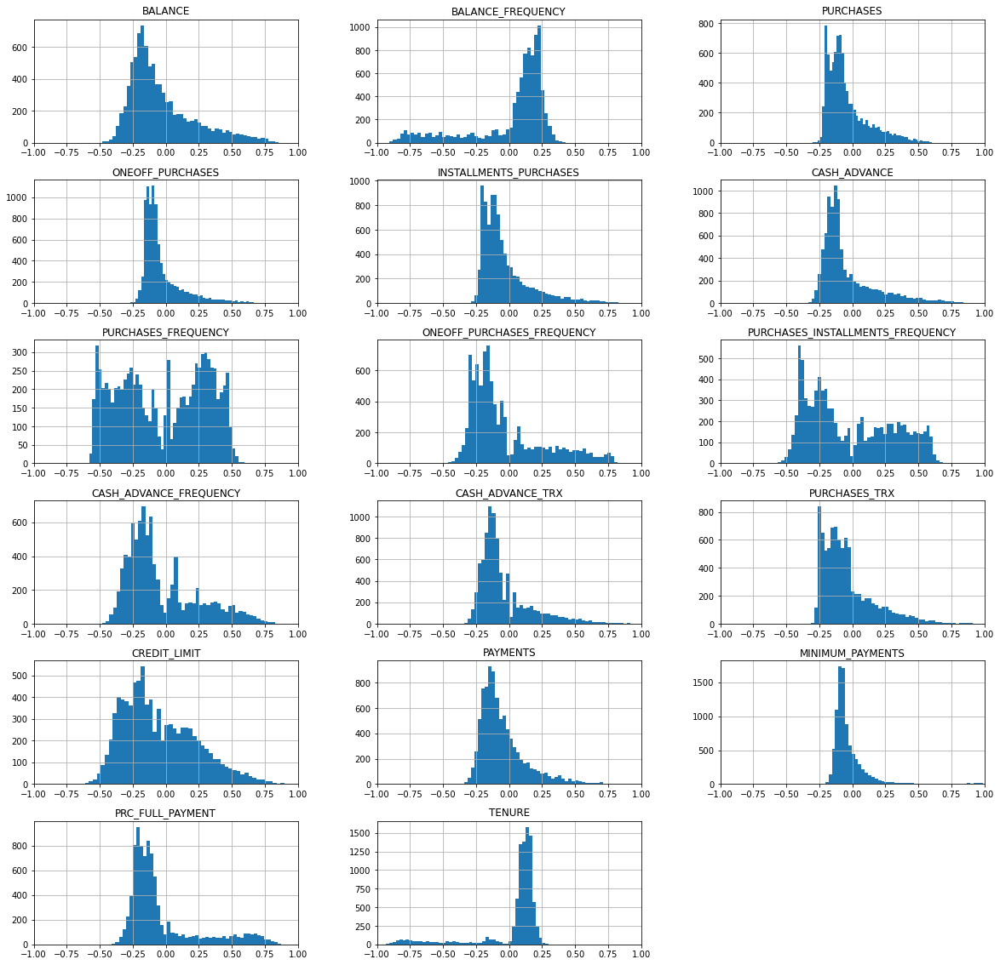

In [12]:
ax_list=df.hist(bins=50, figsize=(20,20), layout=(6,3))
for i in range(6):    
    for j in range(3):
        ax_list[i][j].set_xlim((-1,1))

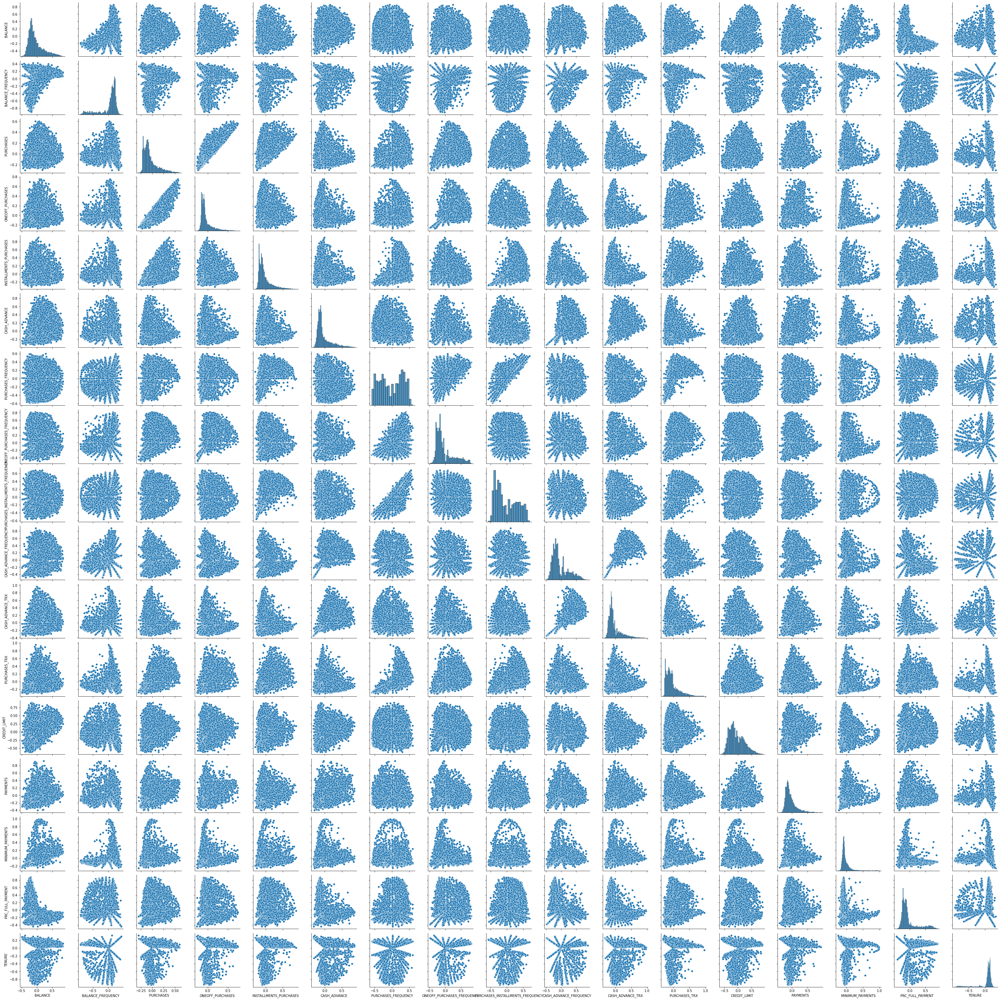

In [13]:
sns.pairplot(df)

<AxesSubplot:>

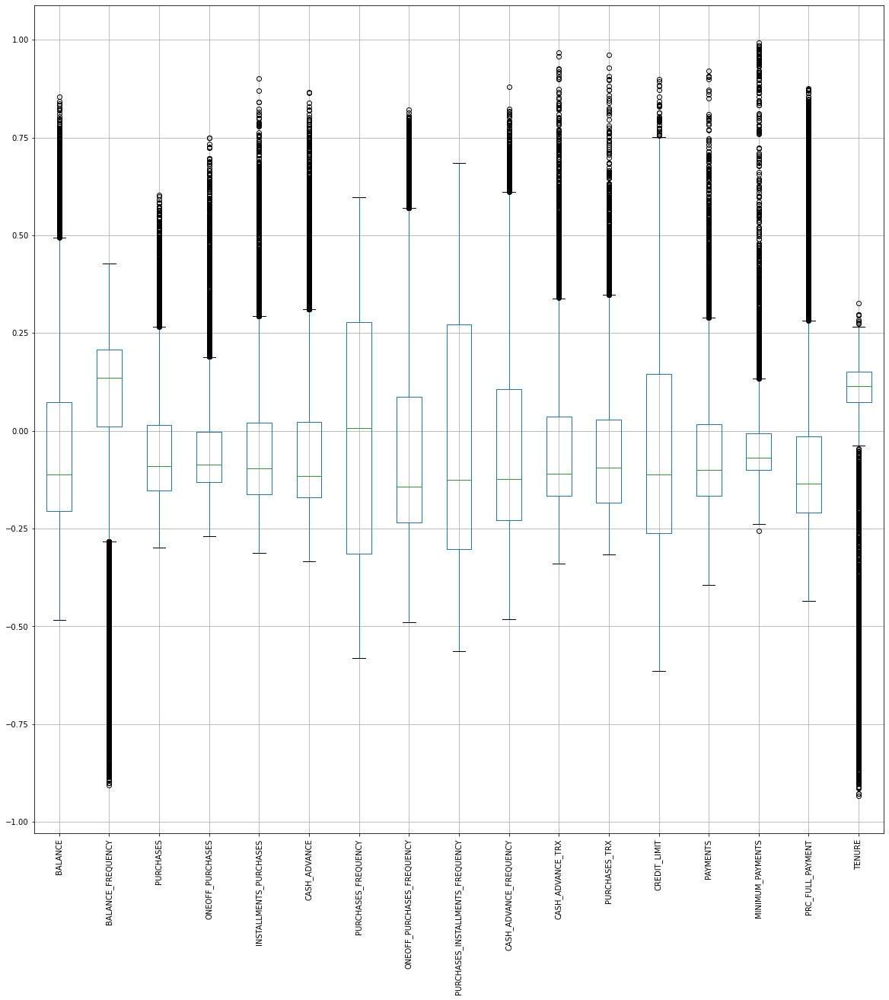

In [14]:
df.boxplot(figsize=(20,20), rot = 90)

### As we can see if we removed the outliers we will lose alot of data

# Applying Principal Component Analysis (PCA) to fit the data and concentrate it more instead of handling the outliers and losing more than 60% of the data

In [15]:
pca = PCA(n_components = 2)
pcdf = pca.fit_transform(df)
pcdf = pd.DataFrame(pcdf)
pcdf.columns = ['PC1', 'PC2']

.

# Kmeans

 .

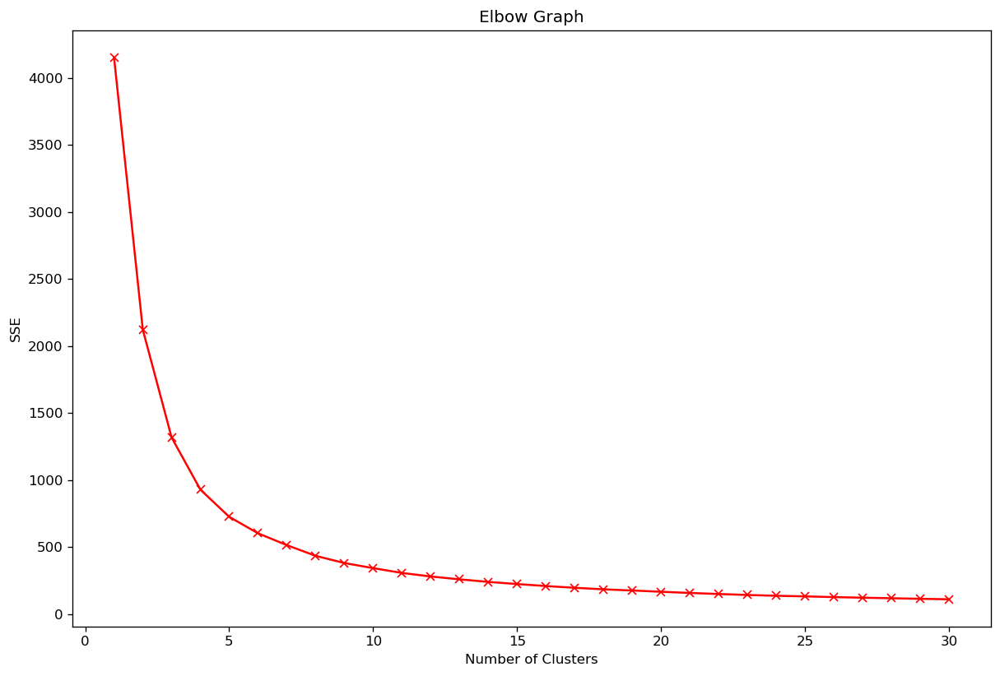

In [17]:
SSE = []

for k in range(1, 31):
    model = KMeans(n_clusters = k)
    model.fit(pcdf)
    SSE.append(model.inertia_)

plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(range(1, 31), SSE, color = 'r', marker = 'x')
plt.xlabel('Number of Clusters')
plt.ylabel('SSE')
plt.title('Elbow Graph')
plt.show()

In [18]:
kl = KneeLocator(range(1, 31), SSE, curve = 'convex', direction = 'decreasing')
kl.elbow

5

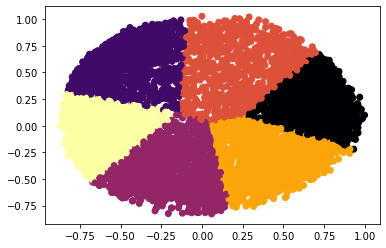

In [19]:
kmeans = KMeans(n_clusters=6)
kmeans.fit(pcdf)
plt.scatter(pcdf['PC1'], pcdf['PC2'],  
           c = kmeans.fit_predict(pcdf),cmap ='inferno_r') 
plt.show() 

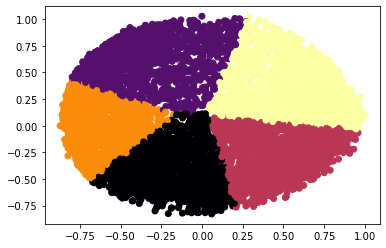

In [20]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(pcdf)
plt.scatter(pcdf['PC1'], pcdf['PC2'],  
           c = kmeans.fit_predict(pcdf),cmap ='inferno_r') 
plt.show() 

### As we can see, when plotting 5 clusters the data is sliced more perfect than 6 clusters

.

# Agglomerative

.

### Plotting a dendogram to determine the optimum number of clusters by cutting the longest vertical line by a  horizontal red line and taking the number of lines intersectingwith the red line.

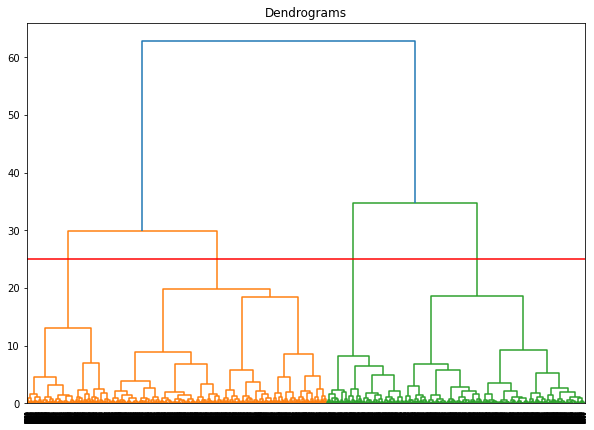

In [21]:
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(pcdf, method='ward'))
plt.axhline(y = 25, color = 'r', linestyle = '-')

### As we can see the red line intersected 4 lines so the number of our clusters will be 4

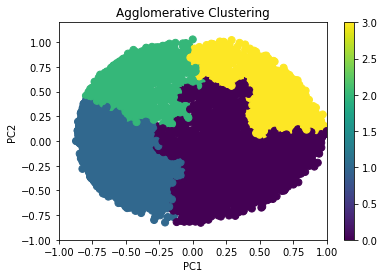

In [22]:
model=AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
clust_labels=model.fit_predict(pcdf) 
agglomerative=pd.DataFrame(clust_labels)
fig =plt.figure()
ax = fig.add_subplot(111)
scatter = ax.scatter (pcdf['PC1'] , pcdf["PC2"] , c= agglomerative[0], s=50)
ax.set_title("Agglomerative Clustering")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_xlim((-1,1))
ax.set_ylim((-1,1.2))
x=plt.colorbar(scatter)
x

### Agglomerative and K-means comparison


Text(0.5, 1.0, 'Kmeans')

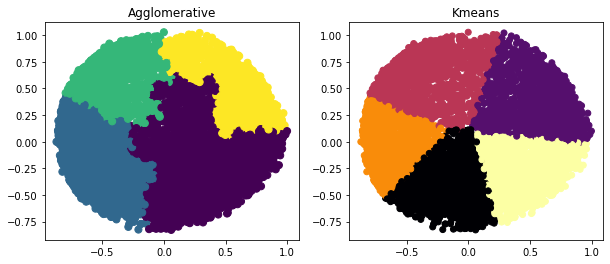

In [23]:
fig, ax = plt.subplots(1, 2, figsize=(10,4))

ax[0].scatter(pcdf['PC1'] , pcdf["PC2"] , c= agglomerative[0], s=50)
ax[0].set_title("Agglomerative")
ax[1].scatter(pcdf['PC1'], pcdf['PC2'],  
           c = kmeans.fit_predict(pcdf),cmap ='inferno_r')
ax[1].set_title("Kmeans")

# Conclusion: The Kmeans model sliced the data more perfectly as the Agglomerative model had the clusters interconnected